In [1]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from tensorflow import keras
import math
np.set_printoptions(threshold=np.inf)
np.set_printoptions(precision=3, suppress=True)
from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, losses
from tensorflow.keras.models import Model
import plotly.express as px
from sklearn.decomposition import PCA

In [2]:
# Load data gao for train and valid

lrf_data_train_valid_raw = np.loadtxt("data_lrf.csv", dtype=np.str_, delimiter=",")[0:52700,0:].astype(np.float64)
mc_data_train_valid_raw = np.loadtxt("data_mc_time_scaled.csv", dtype=np.str_, delimiter=",")[1:52701,0:].astype(np.float64)
print(lrf_data_train_valid_raw.shape,  mc_data_train_valid_raw.shape)


(52700, 521) (52700, 4)


In [3]:
# Load data gao for test

lrf_data_test_raw = np.loadtxt("test_data_lrf1.csv", dtype=np.str_, delimiter=",")[27:11469,0:].astype(np.float64)
mc_data_test_raw = np.loadtxt("data_test_mc_time_scaled.csv", dtype=np.str_, delimiter=",")[1:,0:].astype(np.float64)
print(lrf_data_test_raw.shape,  mc_data_test_raw.shape)


(11442, 521) (11442, 4)


In [4]:
# Load data xue for test

lrf_data_xue = np.loadtxt("Xue_data_lidar1.csv", dtype=np.str_, delimiter=",")[2:13968,:].astype(np.float64)
mc_data_xue = np.loadtxt("Xue_data_mc_time_scaled.csv", dtype=np.str_, delimiter=",")[1:13967,0:].astype(np.float64)
print(lrf_data_xue.shape,  mc_data_xue.shape)


(13966, 521) (13966, 4)


In [5]:
# Load data salsh for test

lrf_data_salsh = np.loadtxt("salah_data_lrf.csv", dtype=np.str_, delimiter=",")[2:14476,:].astype(np.float64)
mc_data_salsh = np.loadtxt("salah_data_mc_time_scaled.csv", dtype=np.str_, delimiter=",")[1:14475,0:].astype(np.float64)
print(lrf_data_salsh.shape,  mc_data_salsh.shape)


(14474, 521) (14474, 4)


In [6]:
# Load data ibram for test

lrf_data_ibram = np.loadtxt("ibram_data_lrf.csv", dtype=np.str_, delimiter=",")[828:8550,:].astype(np.float64)
mc_data_ibram = np.loadtxt("ibram_data_mc_time_scaled.csv", dtype=np.str_, delimiter=",")[1:,0:].astype(np.float64)
print(lrf_data_ibram.shape,  mc_data_ibram.shape)


(7722, 521) (7722, 4)


In [7]:
lrf_data_train_valid_raw = np.concatenate((lrf_data_train_valid_raw,lrf_data_test_raw),axis = 0)
mc_data_train_valid_raw = np.concatenate((mc_data_train_valid_raw,mc_data_test_raw),axis = 0)

lrf_data_train_valid_raw = np.concatenate((lrf_data_train_valid_raw,lrf_data_xue),axis = 0)
mc_data_train_valid_raw = np.concatenate((mc_data_train_valid_raw,mc_data_xue),axis = 0)

lrf_data_train_valid_raw = np.concatenate((lrf_data_train_valid_raw,lrf_data_salsh),axis = 0)
mc_data_train_valid_raw = np.concatenate((mc_data_train_valid_raw,mc_data_salsh),axis = 0)

lrf_data_train_valid_raw = np.concatenate((lrf_data_train_valid_raw,lrf_data_ibram),axis = 0)
mc_data_train_valid_raw = np.concatenate((mc_data_train_valid_raw,mc_data_ibram),axis = 0)

In [8]:
print(lrf_data_train_valid_raw[12200+52700][0])

1667403029.0


In [8]:
# legs and point cloud train
lrf_data_train_leg_raw = []
lrf_data_train_point_raw = []
for i in range(lrf_data_train_valid_raw.shape[0]):
    lrf_data_train_leg_raw.append(lrf_data_train_valid_raw[i][517:])
    lrf_data_train_point_raw.append(lrf_data_train_valid_raw[i][2:514])
lrf_data_train_leg_raw=np.array(lrf_data_train_leg_raw)
lrf_data_train_point_raw=np.array(lrf_data_train_point_raw)

print(lrf_data_train_leg_raw.shape, lrf_data_train_point_raw.shape)


for i in range(lrf_data_train_leg_raw.shape[0]):
    if lrf_data_train_leg_raw[i][3] == 0:
        lrf_data_train_leg_raw[i][3] = lrf_data_train_leg_raw[i-1][3]
    if lrf_data_train_leg_raw[i][2] == 0:
        lrf_data_train_leg_raw[i][2] = lrf_data_train_leg_raw[i-1][2]
    if lrf_data_train_leg_raw[i][1] == 0:
        lrf_data_train_leg_raw[i][1] = lrf_data_train_leg_raw[i-1][1]
    if lrf_data_train_leg_raw[i][0] == 0:
        lrf_data_train_leg_raw[i][0] = lrf_data_train_leg_raw[i-1][0]
    

# point cloud en x&y
lrf_data_train_point_x = []
lrf_data_train_point_y = []
lrf_data_train_point_xy = []

for i in range(lrf_data_train_point_raw.shape[0]):
    x = []
    y = []
    for j in range(lrf_data_train_point_raw.shape[1]):
        if lrf_data_train_point_raw[i][j] !=0:
            x.append(lrf_data_train_point_raw[i][j]*math.cos((j/512)*3.14159265359))
            y.append(lrf_data_train_point_raw[i][j]*math.sin((j/512)*3.14159265359))
    lrf_data_train_point_x.append(x)
    lrf_data_train_point_y.append(y)

    
# PCA
lrf_data_train_point_PCA = []
mean_x_his = 0
mean_y_his = 0
for i in range(len(lrf_data_train_point_x)):
    point_cloud = np.transpose(np.concatenate(([lrf_data_train_point_x[i]],[lrf_data_train_point_y[i]]),axis = 0))
    if len(point_cloud) == 0 :
        lrf_data_train_point_PCA.append(lrf_data_train_point_PCA[-1])
    elif len(point_cloud) == 1 :
        lrf_data_train_point_PCA.append(lrf_data_train_point_PCA[-1])
    else:
        if (i == 0):
            pca = PCA(n_components=2)
            pca.fit(point_cloud)
            PCA(copy=True, n_components=2, whiten=False)
            mean_x_his = pca.mean_[0]
            mean_y_his = pca.mean_[1]
            delta_x_his = abs(lrf_data_train_leg_raw[i][0]-lrf_data_train_leg_raw[i][2])
            delta_y_his = abs(lrf_data_train_leg_raw[i][1]-lrf_data_train_leg_raw[i][3])
            
            lrf_data_train_point_PCA.append([pca.mean_[0],pca.mean_[1],
                                             pca.explained_variance_ratio_[0]*pca.components_[0][0],
                                             pca.explained_variance_ratio_[0]*pca.components_[0][1], 
                                             pca.explained_variance_ratio_[1]*pca.components_[1][0],
                                             pca.explained_variance_ratio_[1]*pca.components_[1][1],
                                             ])
#abs(lrf_data_train_leg_raw[i][0]-lrf_data_train_leg_raw[i][2]),abs(lrf_data_train_leg_raw[i][1]-lrf_data_train_leg_raw[i][3])
#             lrf_data_train_point_PCA.append([pca.mean_[0],pca.mean_[1],math.sqrt(pca.explained_variance_ratio_[0]),
#                                             math.sqrt(pca.explained_variance_ratio_[1]),pca.components_[0][0],
#                                             pca.components_[0][1], pca.components_[1][0],
#                                            pca.components_[1][1]])
            
#             lrf_data_train_point_PCA.append([pca.mean_[0],pca.mean_[1],math.sqrt(pca.explained_variance_ratio_[0])*pca.components_[0][0],
#                                              math.sqrt(pca.explained_variance_ratio_[0])*pca.components_[0][1], 
#                                              math.sqrt(pca.explained_variance_ratio_[1])*pca.components_[1][0],
#                                              math.sqrt(pca.explained_variance_ratio_[1])*pca.components_[1][1]])

            #lrf_data_train_point_PCA.append([pca.mean_[0],pca.mean_[1],pca.explained_variance_ratio_[0],
            #                                pca.explained_variance_ratio_[1],pca.components_[0][0],
            #                                pca.components_[0][1], pca.components_[1][0],
            #                               pca.components_[1][1]])
        else:
            pca = PCA(n_components=2)
            pca.fit(point_cloud)
            PCA(copy=True, n_components=2, whiten=False)
            delta_x = pca.mean_[0] - mean_x_his
            delta_y = pca.mean_[1] - mean_y_his
            #if (delta_x * pca.components_[0][0] + delta_y * pca.components_[0][1] < 0):
                #pca.components_[0][0] = -pca.components_[0][0]
                #pca.components_[0][1] = -pca.components_[0][1]
            #if (delta_x * pca.components_[1][0] + delta_y * pca.components_[1][1] < 0):
                #pca.components_[1][0] = -pca.components_[1][0]
                #pca.components_[1][1] = -pca.components_[1][1]
            mean_x_his = pca.mean_[0]
            mean_y_his = pca.mean_[1]
            

            lrf_data_train_point_PCA.append([pca.mean_[0],pca.mean_[1],
                                             pca.explained_variance_ratio_[0]*pca.components_[0][0],
                                             pca.explained_variance_ratio_[0]*pca.components_[0][1], 
                                             pca.explained_variance_ratio_[1]*pca.components_[1][0],
                                             pca.explained_variance_ratio_[1]*pca.components_[1][1],
                                             ])
#abs(lrf_data_train_leg_raw[i][0]-lrf_data_train_leg_raw[i][2]),abs(lrf_data_train_leg_raw[i][1]-lrf_data_train_leg_raw[i][3])
            delta_x_his = abs(lrf_data_train_leg_raw[i][0]-lrf_data_train_leg_raw[i][2])
            delta_y_his = abs(lrf_data_train_leg_raw[i][1]-lrf_data_train_leg_raw[i][3])
#             lrf_data_train_point_PCA.append([pca.mean_[0],pca.mean_[1],pca.explained_variance_ratio_[0]*pca.components_[0][0],
#                                              pca.explained_variance_ratio_[0]*pca.components_[0][1], 
#                                              pca.explained_variance_ratio_[1]*pca.components_[1][0],
#                                              pca.explained_variance_ratio_[1]*pca.components_[1][1],
#                                              pca.explained_variance_[0],pca.explained_variance_[1]])
#             lrf_data_train_point_PCA.append([pca.mean_[0],pca.mean_[1],math.sqrt(pca.explained_variance_ratio_[0])*pca.components_[0][0],
#                                              math.sqrt(pca.explained_variance_ratio_[0])*pca.components_[0][1], 
#                                              math.sqrt(pca.explained_variance_ratio_[1])*pca.components_[1][0],
#                                              math.sqrt(pca.explained_variance_ratio_[1])*pca.components_[1][1]])
            
            
#             lrf_data_train_point_PCA.append([pca.mean_[0],pca.mean_[1],math.sqrt(pca.explained_variance_ratio_[0]),
#                                             math.sqrt(pca.explained_variance_ratio_[1]),pca.components_[0][0],
#                                             pca.components_[0][1], pca.components_[1][0],
#                                            pca.components_[1][1]])
            
lrf_data_train_point_PCA = np.array(lrf_data_train_point_PCA)
print(lrf_data_train_point_PCA.shape)
print(lrf_data_train_point_PCA[1]) 


lens=[]
for i in range(lrf_data_train_point_raw.shape[0]):
    lens.append(len(lrf_data_train_point_x[i]))
max_len = max(lens)
feature_n = max_len
for i in range(lrf_data_train_point_raw.shape[0]):
    lrf_data_train_point_x[i].extend([0]*(max_len - len(lrf_data_train_point_x[i])))
    lrf_data_train_point_y[i].extend([0]*(max_len - len(lrf_data_train_point_y[i])))

lrf_data_train_point_x = np.array(lrf_data_train_point_x)
lrf_data_train_point_y = np.array(lrf_data_train_point_y)

for i in range(len(lrf_data_train_point_raw)):
    lrf_data_train_point_xy.append(np.concatenate((lrf_data_train_point_x[i],lrf_data_train_point_y[i]),axis = 0))

lrf_data_train_point_xy = np.array(lrf_data_train_point_xy)

print(lrf_data_train_point_xy.shape)


# yaw en sin&cos
mc_data_train_valid_trans = []
mc_data_train_valid_trans_x = []
mc_data_train_valid_trans_y = []
for i in range(mc_data_train_valid_raw.shape[0]):
    mc_data_train_valid_trans.append([math.sin(mc_data_train_valid_raw[i][3]),math.cos(mc_data_train_valid_raw[i][3])])
    mc_data_train_valid_trans_x.append(math.sin(mc_data_train_valid_raw[i][3]))
    mc_data_train_valid_trans_y.append(math.cos(mc_data_train_valid_raw[i][3]))
mc_data_train_valid_trans = np.array(mc_data_train_valid_trans)
mc_data_train_valid_trans_x = np.array(mc_data_train_valid_trans_x)
mc_data_train_valid_trans_y = np.array(mc_data_train_valid_trans_y)

print(mc_data_train_valid_trans.shape)



(100304, 4) (100304, 512)
(100304, 6)
[-0.019  0.879  0.958  0.122 -0.004  0.034]
(100304, 308)
(100304, 2)


In [20]:
from sklearn.preprocessing import StandardScaler
scaler_x = StandardScaler()
lrf_data_train_point_x_scale = scaler_x.fit_transform(lrf_data_train_point_x)
scaler_y = StandardScaler()
lrf_data_train_point_y_scale = scaler_y.fit_transform(lrf_data_train_point_y)



In [205]:
plot_x = []
plot_y = []
#lrf_data_train_point_PCA
for i in range(lrf_data_train_point_PCA.shape[0]):
    plot_x.append(lrf_data_train_point_PCA[i][6])
    plot_y.append(lrf_data_train_point_PCA[i][7])

fig = px.line(y=plot_x)
#fig = px.line(y=[yaw_predict[52700:],yaw_gt[52700:]])
fig.show()

fig1 = px.line(y=plot_y)
#fig = px.line(y=[yaw_predict[52700:],yaw_gt[52700:]])
fig1.show()

IndexError: index 6 is out of bounds for axis 0 with size 6

In [9]:
# crate data for RNN
time_step = 50
lrf_data_train_point_xy_RNN = []
mc_data_train_valid_trans_RNN = []
for i in range(len(lrf_data_train_point_xy)-time_step):
    lrf_data_train_point_xy_RNN.append(lrf_data_train_point_PCA[i:i+time_step,:])
    mc_data_train_valid_trans_RNN.append(mc_data_train_valid_trans[i+time_step])

lrf_data_train_point_xy_RNN = np.array(lrf_data_train_point_xy_RNN)
mc_data_train_valid_trans_RNN = np.array(mc_data_train_valid_trans_RNN)
lrf_data_train_point_xy_RNN = lrf_data_train_point_xy_RNN.reshape(len(lrf_data_train_point_xy)-time_step,time_step, 6)
print(lrf_data_train_point_xy_RNN.shape,mc_data_train_valid_trans_RNN.shape)


(100254, 50, 6) (100254, 2)


Model: "autoencoder_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_21 (Sequential)  (None, 40)                23528     
                                                                 
 sequential_22 (Sequential)  (None, 98)                17314     
                                                                 
Total params: 40,842
Trainable params: 40,842
Non-trainable params: 0
_________________________________________________________________
Model: "autoencoder_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_23 (Sequential)  (None, 40)                17256     
                                                                 
 sequential_24 (Sequential)  (None, 98)                17314     
                                                                 
Total params: 34,570
Trai

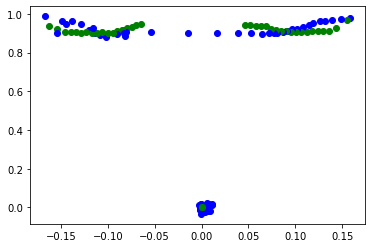

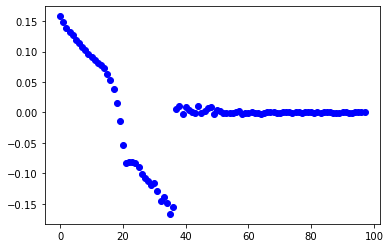

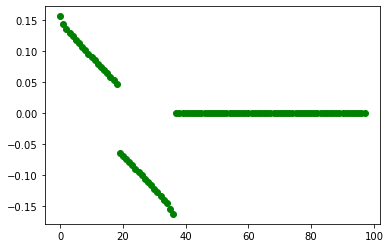

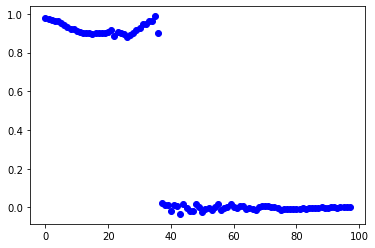

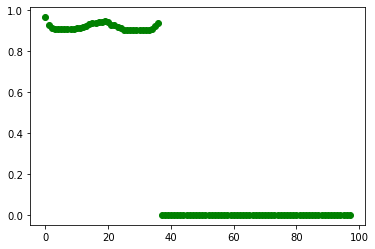

(64092, 50, 80) (64092, 2)


In [43]:
# modle AE
feature_n = 40
class Autoencoder(Model):
  def __init__(self):
    super(Autoencoder, self).__init__()  
    self.encoder = tf.keras.Sequential([
        layers.Dense(64, activation='tanh'),
        layers.Dense(64, activation='relu'),
        layers.Dense(64, activation='relu'),
        layers.Dense(feature_n, activation='relu'),
    ])
    self.decoder = tf.keras.Sequential([
        layers.Dense(64, activation='relu'),
        layers.Dense(64, activation='relu'),
        layers.Dense(64, activation='tanh'),
        layers.Dense(98, activation='tanh'),
    ])

  def call(self, x):
    encoded = self.encoder(x)
    decoded = self.decoder(encoded)
    return decoded


autoencoder = Autoencoder()
autoencoder.build(input_shape=(None,196))
autoencoder.summary()

autoencoder_x = Autoencoder()
autoencoder_x.build(input_shape=(None,98))
autoencoder_x.summary()

autoencoder_y = Autoencoder()
autoencoder_y.build(input_shape=(None,98))
autoencoder_y.summary()

autoencoder_x.compile(loss=losses.MeanSquaredError(),
    optimizer=tf.keras.optimizers.Adam(0.0002))

history = autoencoder_x.fit(
    lrf_data_train_point_x[:52700],
    lrf_data_train_point_x[:52700],
    shuffle=True,
    validation_split=0.2,
    verbose=1, epochs=40)

autoencoder_y.compile(loss=losses.MeanSquaredError(),
    optimizer=tf.keras.optimizers.Adam(0.0002))

history = autoencoder_y.fit(
    lrf_data_train_point_y[:52700],
    lrf_data_train_point_y[:52700],
    shuffle=True,
    validation_split=0.2,
    verbose=1, epochs=40)

lfr_data_encoder_x = autoencoder_x.encoder(lrf_data_train_point_x).numpy()
lfr_data_decoder_x = autoencoder_x.decoder(lfr_data_encoder_x).numpy()
lfr_data_encoder_y = autoencoder_y.encoder(lrf_data_train_point_y).numpy()
lfr_data_decoder_y = autoencoder_y.decoder(lfr_data_encoder_y).numpy()

#lfr_data_encoder_x_final = scaler_x.inverse_transform(lfr_data_decoder_x)
#lfr_data_encoder_y_final = scaler_y.inverse_transform(lfr_data_decoder_y)
# visual decoder performence
t = 61000
for i in range(98):
    plt.plot(lfr_data_decoder_x[t][i],lfr_data_decoder_y[t][i],'o',c = 'b')
    plt.plot(lrf_data_train_point_xy[t][i],lrf_data_train_point_xy[t][i+98],'o',c = 'g')
plt.show()


plt.plot(lfr_data_decoder_x[t][0:98],'o',c = 'b')
plt.show()

plt.plot(lrf_data_train_point_xy[t][0:98],'o',c = 'g')
plt.show()

plt.plot(lfr_data_decoder_y[t][0:98],'o',c = 'b')
plt.show()

plt.plot(lrf_data_train_point_xy[t][0+98:98+98],'o',c = 'g')
plt.show()

# crate data for RNN
lfr_data_encoder_xy = np.concatenate((lfr_data_encoder_x,lfr_data_encoder_y),axis = 1)

time_step = 50
lrf_data_train_point_xy_RNN = []
mc_data_train_valid_trans_RNN = []
for i in range(len(lfr_data_encoder_xy)-time_step):
    lrf_data_train_point_xy_RNN.append(lfr_data_encoder_xy[i:i+time_step,:])
    mc_data_train_valid_trans_RNN.append(mc_data_train_valid_trans[i+time_step])

lrf_data_train_point_xy_RNN = np.array(lrf_data_train_point_xy_RNN)
mc_data_train_valid_trans_RNN = np.array(mc_data_train_valid_trans_RNN)
lrf_data_train_point_xy_RNN = lrf_data_train_point_xy_RNN.reshape(len(lrf_data_train_point_xy)-time_step,time_step, feature_n*2)
print(lrf_data_train_point_xy_RNN.shape,mc_data_train_valid_trans_RNN.shape)


In [42]:
loss, accuracy = autoencoder_x.evaluate(lrf_data_train_point_x[53000:], lrf_data_train_point_x[53000:], verbose=2)
#print('loss: {:.2f} accuracy: {:.2f}% '.format(loss, accuracy * 100))

349/349 - 0s - loss: 1.1559e-04 - 297ms/epoch - 850us/step


TypeError: cannot unpack non-iterable float object

In [36]:
# model RNN 
model_RNN = keras.Sequential([
    keras.layers.GRU(20, return_sequences=True,input_shape = (time_step,6)),
    keras.layers.GRU(20, return_sequences=True),
    keras.layers.GRU(20, return_sequences=True),
    #keras.layers.GRU(20, return_sequences=True),
    #keras.layers.GRU(20, return_sequences=True),
    #keras.layers.Conv1D(10, 3, activation='relu'),
    keras.layers.GRU(20, return_sequences=False),

    keras.layers.Dense(64),#128
    keras.layers.Dense(64),#128 0.00379
    keras.layers.Dense(2)
])
model_RNN.summary()


Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_8 (GRU)                 (None, 50, 20)            1680      
                                                                 
 gru_9 (GRU)                 (None, 50, 20)            2520      
                                                                 
 gru_10 (GRU)                (None, 50, 20)            2520      
                                                                 
 gru_11 (GRU)                (None, 20)                2520      
                                                                 
 dense_6 (Dense)             (None, 64)                1344      
                                                                 
 dense_7 (Dense)             (None, 64)                4160      
                                                                 
 dense_8 (Dense)             (None, 2)                

In [22]:
lrf_new_train = np.concatenate((lrf_data_train_point_xy_RNN[:52700-time_step],lrf_data_train_point_xy_RNN[52700+13150:52700+14000]),axis = 0)
print(lrf_new_train.shape)
mc_new_train = np.concatenate((mc_data_train_valid_trans_RNN[:52700-time_step],mc_data_train_valid_trans_RNN[52700+13150:52700+14000]),axis = 0)



(53500, 50, 6)


Epoch 1/10
1317/1317 [==============================] - 10s 6ms/step - loss: 0.0132 - val_loss: 0.0289
Epoch 2/10
1317/1317 [==============================] - 8s 6ms/step - loss: 0.0129 - val_loss: 0.0293
Epoch 3/10
1317/1317 [==============================] - 8s 6ms/step - loss: 0.0126 - val_loss: 0.0290
Epoch 4/10
1317/1317 [==============================] - 8s 6ms/step - loss: 0.0124 - val_loss: 0.0290
Epoch 5/10
1317/1317 [==============================] - 8s 6ms/step - loss: 0.0122 - val_loss: 0.0296
Epoch 6/10
1317/1317 [==============================] - 8s 6ms/step - loss: 0.0121 - val_loss: 0.0294
Epoch 7/10
1317/1317 [==============================] - 8s 6ms/step - loss: 0.0119 - val_loss: 0.0293
Epoch 8/10
1317/1317 [==============================] - 8s 6ms/step - loss: 0.0117 - val_loss: 0.0294
Epoch 9/10
1317/1317 [==============================] - 8s 6ms/step - loss: 0.0116 - val_loss: 0.0301
Epoch 10/10
1317/1317 [==============================] - 8s 6ms/step - loss: 0.01

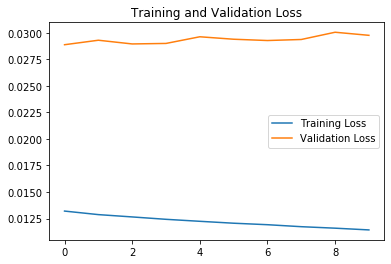

In [52]:
model_RNN.compile(loss='mse',
    optimizer=tf.keras.optimizers.Adam(0.0001))

history = model_RNN.fit(
    lrf_data_train_point_xy_RNN[:52700-time_step],
    mc_data_train_valid_trans_RNN[:52700-time_step],
    #lrf_new_train,
    #mc_new_train,
    validation_split=0.2,
    verbose=1, epochs=10)

loss = history.history['loss']  # 训练集损失 最远两点距离 0.0287
val_loss = history.history['val_loss']  # 测试集损失
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()



In [85]:
predict_model_RNN = model_RNN.predict(lrf_data_train_point_xy_RNN)
yaw_predict = []
for i in range(len(predict_model_RNN)):
    yaw_predict.append(math.atan2(predict_model_RNN[i][0],predict_model_RNN[i][1]))

yaw_gt = []
for i in range(len(lrf_data_train_point_xy_RNN)):
    yaw_gt.append(mc_data_train_valid_raw[i+time_step][3])


3133/3133 [==============================] - 7s 2ms/step


In [225]:
model_RNN.save_weights('model_RNN_11291454_5')


In [83]:
model_RNN.load_weights('model_RNN_11291454_4')


11.827658736004599


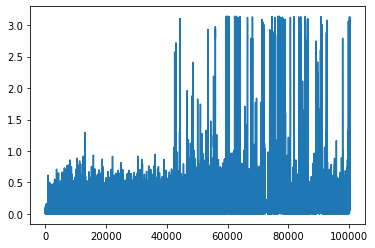

In [86]:
# predict error for train and validation 12 _3 best model _1 best premodel _2 normal model _4 0.0290

error_model_RNN_total = []
summmm = 0
for i in range(int(1*len(lrf_data_train_point_xy_RNN))):
    if yaw_predict[i]-yaw_gt[i] > 1 * 3.1415926:
        error_model_RNN_total.append(abs(yaw_predict[i]-yaw_gt[i]- 2*3.14159265359))
    elif yaw_predict[i]-yaw_gt[i] < - 1 * 3.1415926:
        error_model_RNN_total.append(abs(yaw_predict[i]-yaw_gt[i]+ 2*3.14159265359))
    else:
        error_model_RNN_total.append(abs(yaw_predict[i]-yaw_gt[i]))
    summmm = summmm + abs(error_model_RNN_total[-1])
print(summmm/len(lrf_data_train_point_xy_RNN)/3.14159265359 * 180)
plt.plot(error_model_RNN_total)
plt.show()

In [87]:
# predict error for train 5.7
error_train = []
summmm = 0
for i in range(int(52700*0.8)):
    if yaw_predict[i]-yaw_gt[i] > 1*3.1415926:
        error_train.append(abs(yaw_predict[i]-yaw_gt[i]-2*3.14159265359))
    elif yaw_predict[i]-yaw_gt[i] < - 1*3.1415926:
        error_train.append(abs(yaw_predict[i]-yaw_gt[i]+2*3.14159265359))
    else:
        error_train.append(abs(yaw_predict[i]-yaw_gt[i]))
    summmm = summmm + abs(error_train[-1])
print(summmm/(int(52700*0.8))/3.14159265359 * 180)

5.462225876625603


In [88]:
# predict error for validation 8.5
error_valid = []
summmm = 0
for i in range(int(52700*0.8),int(52700)):
    if yaw_predict[i]-yaw_gt[i] > 1*3.1415926:
        error_valid.append(abs(yaw_predict[i]-yaw_gt[i]-2*3.14159265359))
    elif yaw_predict[i]-yaw_gt[i] < - 1*3.1415926:
        error_valid.append(abs(yaw_predict[i]-yaw_gt[i]+2*3.14159265359))
    else:
        error_valid.append(abs(yaw_predict[i]-yaw_gt[i]))
    summmm = summmm + abs(error_valid[-1])
print(summmm/((0.2)*52700) /3.14159265359 * 180)


9.049315955853503


In [89]:
# predict error for test gao 16.2
error_valid = []
summmm = 0
for i in range(int(52700),int(11442+52700)):
    if yaw_predict[i]-yaw_gt[i] > 1*3.1415926:
        error_valid.append(abs(yaw_predict[i]-yaw_gt[i]-2*3.14159265359))
    elif yaw_predict[i]-yaw_gt[i] < - 1*3.1415926:
        error_valid.append(abs(yaw_predict[i]-yaw_gt[i]+2*3.14159265359))
    else:
        error_valid.append(abs(yaw_predict[i]-yaw_gt[i]))
    summmm = summmm + abs(error_valid[-1])
print(summmm/(11442)/3.14159265359 * 180)

16.230163482407622


In [90]:
# predict error for test xue 19.7
error_valid = []
summmm = 0
for i in range(int(52700+11442),int(11442+52700+13966-time_step)):
    if yaw_predict[i]-yaw_gt[i] > 1*3.1415926:
        error_valid.append(abs(yaw_predict[i]-yaw_gt[i]-2*3.14159265359))
    elif yaw_predict[i]-yaw_gt[i] < - 1*3.1415926:
        error_valid.append(abs(yaw_predict[i]-yaw_gt[i]+2*3.14159265359))
    else:
        error_valid.append(abs(yaw_predict[i]-yaw_gt[i]))
    summmm = summmm + abs(error_valid[-1])
print(summmm/(13966-time_step)/3.14159265359 * 180)


19.737402264302702


In [91]:
# predict error for test salah 20.5
error_valid = []
summmm = 0
for i in range(int(11442+52700+13966),int(11442+52700+13966+lrf_data_salsh.shape[0])):
    if yaw_predict[i]-yaw_gt[i] > 1*3.1415926:
        error_valid.append(abs(yaw_predict[i]-yaw_gt[i]-2*3.14159265359))
    elif yaw_predict[i]-yaw_gt[i] < - 1*3.1415926:
        error_valid.append(abs(yaw_predict[i]-yaw_gt[i]+2*3.14159265359))
    else:
        error_valid.append(abs(yaw_predict[i]-yaw_gt[i]))
    summmm = summmm + abs(error_valid[-1])
print(summmm/(lrf_data_salsh.shape[0])/3.14159265359 * 180)

20.49439211748713


In [92]:
# predict error for test ibram 10.6
error_valid = []
summmm = 0
for i in range(int(11442+52700+13966+lrf_data_salsh.shape[0]),int(11442+52700+13966+lrf_data_salsh.shape[0]+lrf_data_ibram.shape[0]-time_step)):
    if yaw_predict[i]-yaw_gt[i] > 1*3.1415926:
        error_valid.append(abs(yaw_predict[i]-yaw_gt[i]-2*3.14159265359))
    elif yaw_predict[i]-yaw_gt[i] < - 1*3.1415926:
        error_valid.append(abs(yaw_predict[i]-yaw_gt[i]+2*3.14159265359))
    else:
        error_valid.append(abs(yaw_predict[i]-yaw_gt[i]))
    summmm = summmm + abs(error_valid[-1])
print(summmm/(lrf_data_ibram.shape[0]-time_step)/3.14159265359 * 180)


12.841496723357327


In [196]:
import plotly.graph_objs as go
import numpy as np
import pandas as pd

yaw_predict = []
for i in range(len(predict_model_RNN)):
    yaw_predict.append(math.atan2(predict_model_RNN[i][0],predict_model_RNN[i][1]) /3.14159265359 * 180)

yaw_gt = []
for i in range(len(lrf_data_train_point_xy_RNN)):
    yaw_gt.append(mc_data_train_valid_raw[i+time_step][3]/3.14159265359 * 180)

t_s = 2500
t_l = 500

# t_s = 3800
# t_l = 450

# t_s = 6400
# t_l = 705

t_s = 8700
t_l = 3000

t_s = 13000
t_l = 200

t_s = 43600
t_l = 280

t_s = 44450
t_l = 300

t_s = 45500
t_l = 670

t_s = 47280
t_l = 900

t_s = 50200
t_l = 350

t_s = 65860
t_l = 240

t_s = 67420
t_l = 230

t_s = 69900
t_l = 200

t_s = 73200
t_l = 1300

t_s = 82470
t_l = 260

t_s = 85075
t_l = 220

t_s = 87870
t_l = 180

t_s = 89300
t_l = 900


t_s = 43600
t_l = 280

error_valid = []
summmm = 0
for i in range(int(t_s),t_s+int(t_l)):
    if yaw_predict[i]-yaw_gt[i] > 180:
        error_valid.append(abs(yaw_predict[i]-yaw_gt[i]-360))
    elif yaw_predict[i]-yaw_gt[i] < - 180:
        error_valid.append(abs(yaw_predict[i]-yaw_gt[i]+360))
    else:
        error_valid.append(abs(yaw_predict[i]-yaw_gt[i]))
    summmm = summmm + abs(error_valid[-1])
print(summmm/(t_l))

random_x = np.linspace(0, t_l/10, t_l)  
trace0 = go.Scatter(
    x = random_x,
    y=yaw_predict[t_s:t_s+int(t_l)],
    mode="lines",  
    name="GRU",
    marker={
        "size": 5,
        "color": "rgba(255, 12, 111, 0.7)",
    }
)

trace1 = go.Scatter(
    x = random_x,
    y=yaw_gt[t_s:t_s+int(t_l)],
    mode="lines",  
    name="Ground truth",
    marker={
        "size": 5,
        "color": "rgba(12, 255, 111, 0.7)",
    }
)

fig = go.Figure(data=[trace0, trace1],
                layout={"title": {"text": "Predictive performance of neural networks", "font": {"family": "STKaiti", "size": 30}, "x": 0.5},
                        "xaxis": {"title": "time (s)",
                                  "titlefont": {"family": "STKaiti", "size": 15},
                                  "tickangle": -60, "nticks": 20},
                        "yaxis": {"title": "Human Relative Orientation (degree)",
                                  "titlefont": {"family": "STKaiti", "size": 15}},
                        "font": {"size": 20},
                        "template": "plotly_dark"
                        })
fig.show()

4.279469556298672


5.649867605131129


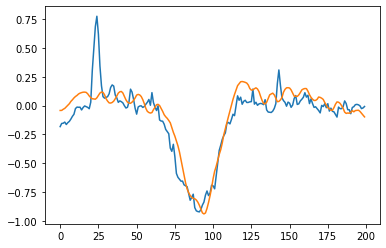

In [105]:
# predict and gt visual
summmm = 0
t = 11442+52700+13966+lrf_data_salsh.shape[0]+950 #52700+int(13520)#11442
error_visual = []
for i in range(t,t+int(200)):
    if yaw_predict[i]-yaw_gt[i] > 1*3.1415926:
        error_visual.append(abs(yaw_predict[i]-yaw_gt[i]-2*3.14159265359))
    elif yaw_predict[i]-yaw_gt[i] < - 1*3.1415926:
        error_visual.append(abs(yaw_predict[i]-yaw_gt[i]+2*3.14159265359))
    else:
        error_visual.append(abs(yaw_predict[i]-yaw_gt[i]))
    summmm = summmm + abs(error_visual[-1])
print(summmm/(int(200))/3.14159265359 * 180)

plt.plot(yaw_predict[t:t+int(200)], label='loss')
plt.plot(yaw_gt[t:t+int(200)], label='val_loss')
plt.show()

fig = px.line(y=[yaw_predict[:],yaw_gt[:]])
#fig = px.line(y=[yaw_predict[int(52700*0.8):52700],yaw_gt[int(52700*0.8):52700]])
#fig = px.line(y=[yaw_predict[52700:],yaw_gt[52700:]])
#fig = px.line(y=[yaw_predict[11442+52700+13966+lrf_data_salsh.shape[0]:],yaw_gt[11442+52700+13966+lrf_data_salsh.shape[0]:]])
fig.show()

In [67]:
# Load data ibram for test

lrf_data_ibram = np.loadtxt("ibram_data_lrf.csv", dtype=np.str_, delimiter=",")[828:8550,:].astype(np.float64)
mc_data_ibram = np.loadtxt("ibram_mc_data.csv", dtype=np.str_, delimiter=",")[1:,0:].astype(np.float64)
print(lrf_data_ibram.shape,  mc_data_ibram.shape)


(7722, 521) (94553, 4)


In [68]:
print(lrf_data_ibram[0][0],lrf_data_ibram[0][1])
print(mc_data_ibram[0][0])


1666791688.0 368657000.0
1666791687.6217494


In [69]:
for i in range(mc_data_ibram.shape[0]-1):
    if mc_data_ibram[i+1][3] - mc_data_ibram[i][3] > 0.12*3.1415926:      
        print(mc_data_ibram[i+1][3] - mc_data_ibram[i][3])
        print(i)
    if mc_data_ibram[i+1][3] - mc_data_ibram[i][3] < -0.12*3.1415926:
        print(mc_data_ibram[i+1][3] - mc_data_ibram[i][3])
        print(i)




1.0897724131993876
84889
-1.6724666102986454
91543
1.5584248974117507
92334


In [70]:
mc_data = []
for i in range(lrf_data_ibram.shape[0]):
    t_now = lrf_data_ibram[i][0] + lrf_data_ibram[i][1]*0.000000001
    for j in range(int(11.5*i),mc_data_ibram.shape[0]):
        if t_now < mc_data_ibram[j][0]:
            mc_data.append(mc_data_ibram[j])
            #print(mc_data[-1])
            break
for i in range(lrf_data_ibram.shape[0]):
    while mc_data[i][3] > 3.14159265359:
        mc_data[i][3] = mc_data[i][3] - 2*3.14159265359
    while mc_data[i][3] < -3.14159265359:
        mc_data[i][3] = mc_data[i][3] + 2*3.14159265359
mc_data = np.array(mc_data)

print(mc_data.shape,mc_data_ibram.shape)

(7722, 4) (94553, 4)


In [71]:
import csv

with open("ibram_data_mc_time_scaled.csv","w") as csvfile: 
    writer = csv.writer(csvfile)
    writer.writerow(["time","x","y","yaw"])
    for index in range(mc_data.shape[0]):
        writer.writerows([[mc_data[index][0],mc_data[index][1],mc_data[index][2],mc_data[index][3]]])

[ 1.667e+09 -4.317e-01 -8.100e-01  2.287e-01]
1666797721.0 971044000.0


In [43]:
def load_lrf_xue():
    tmp = np.loadtxt("data_lidar1.csv", dtype=np.str, delimiter=",")
    data = tmp[100*10:1000*10,517:].astype(np.float)
    return data 

lrf_data_train_xue = load_lrf_xue()

def load_mc_xue():
    tmp = np.loadtxt("test.csv", dtype=np.str, delimiter=",")
    data = tmp[int(100*10*11.98):int(1000*10*11.98),3].astype(np.float)
    return data 

mc_data_train_xue = load_mc_xue()

print(lrf_data_train_xue.shape,  mc_data_train_xue.shape)


<ipython-input-43-5fda105f6a82>:2: DeprecationWarning: `np.str` is a deprecated alias for the builtin `str`. To silence this warning, use `str` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.str_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  tmp = np.loadtxt("data_lidar1.csv", dtype=np.str, delimiter=",")
<ipython-input-43-5fda105f6a82>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  data = tmp[100*10:1000*10,517:].astype(np.float)
<ipython-input-43-5fda105f6a82>:9: DeprecationWarning: `np.str` is a depr

(9000, 4) (107820,)


<ipython-input-43-5fda105f6a82>:10: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  data = tmp[int(100*10*11.98):int(1000*10*11.98),3].astype(np.float)


In [44]:
mc_data_train_xue_2 = []
for i in range(len(lrf_data_train_xue)):
    mc_data_train_xue_2.append(mc_data_train_xue[int(i*11.98)])
for i in range(len(mc_data_train_xue_2)):
    while mc_data_train_xue_2[i] > 3.14159265359:
        mc_data_train_xue_2[i] = mc_data_train_xue_2[i] - 2*3.14159265359
    while mc_data_train_xue_2[i] < -3.14159265359:
        mc_data_train_xue_2[i] = mc_data_train_xue_2[i] + 2*3.14159265359
mc_data_train_xue_2 = np.array(mc_data_train_xue_2)
print(len(mc_data_train_xue_2))

9000


In [47]:
mc_data_trans_xue = []
mc_data_trans_x_xue = []
mc_data_trans_y_xue = []
for i in range(len(mc_data_train_xue_2)):
    mc_data_trans_xue.append([math.sin(mc_data_train_xue_2[i]),math.cos(mc_data_train_xue_2[i])])
    mc_data_trans_x_xue.append(math.sin(mc_data_train_xue_2[i]))
    mc_data_trans_y_xue.append(math.cos(mc_data_train_xue_2[i]))
mc_data_trans_xue = np.array(mc_data_trans_xue)
mc_data_trans_x_xue = np.array(mc_data_trans_x_xue)
mc_data_trans_y_xue = np.array(mc_data_trans_y_xue)

print(mc_data_trans_xue.shape)

(9000, 2)


(8950, 2) (8950, 50, 4)


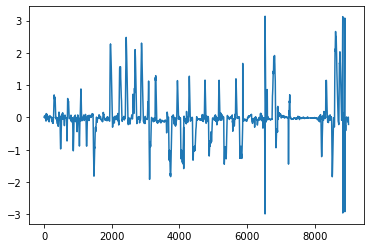

In [54]:
time = 50
lrf_data_time_xue = []
mc_data_time_xue = []
gt_xue = []
for i in range(len(mc_data_trans_xue)-time):
    lrf_data_time_xue.append(lrf_data_train_xue[i:i+time,:])
    mc_data_time_xue.append(mc_data_trans_xue[i+time])
    gt_xue.append(mc_data_train_xue_2[i+time])

lrf_data_time_xue = np.array(lrf_data_time_xue)
mc_data_time_xue = np.array(mc_data_time_xue)
lrf_data_time_xue = lrf_data_time_xue.reshape(len(mc_data_train_xue_2)-time,time, 4)
print(mc_data_time_xue.shape,lrf_data_time_xue.shape)
gt_xue = np.array(gt_xue)


plt.plot(mc_data_train_xue_2, label='loss')
plt.show()

In [51]:


model.compile(loss='mean_squared_error',
    optimizer=tf.keras.optimizers.Adam(0.0005))

history = model.fit(
    lrf_data_time_xue,
    mc_data_time,
    validation_split=0.2,
    verbose=1, epochs=1000)

Epoch 1/1000
224/224 [==============================] - 4s 7ms/step - loss: 0.1290 - val_loss: 0.4579
Epoch 2/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.1311 - val_loss: 0.4023
Epoch 3/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.1369 - val_loss: 0.4126
Epoch 4/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.1341 - val_loss: 0.4403
Epoch 5/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.1313 - val_loss: 0.4393
Epoch 6/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.1309 - val_loss: 0.4456
Epoch 7/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.1327 - val_loss: 0.4394
Epoch 8/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.1326 - val_loss: 0.4492
Epoch 9/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.1255 - val_loss: 0.4464
Epoch 10/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.139

224/224 [==============================] - 1s 5ms/step - loss: 0.1210 - val_loss: 0.4782
Epoch 160/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.1080 - val_loss: 0.4418
Epoch 161/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.1237 - val_loss: 0.3885
Epoch 162/1000
224/224 [==============================] - 1s 4ms/step - loss: 0.1250 - val_loss: 0.3989
Epoch 163/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.1177 - val_loss: 0.4208
Epoch 164/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.1139 - val_loss: 0.4363
Epoch 165/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.1116 - val_loss: 0.4336
Epoch 166/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.1088 - val_loss: 0.4465
Epoch 167/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.1063 - val_loss: 0.4822
Epoch 168/1000
224/224 [==============================] - 1s 5ms/step - loss: 0

Epoch 238/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.1054 - val_loss: 0.4823
Epoch 239/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.1027 - val_loss: 0.4937
Epoch 240/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.1019 - val_loss: 0.5169
Epoch 241/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.1035 - val_loss: 0.5451
Epoch 242/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0925 - val_loss: 0.5100
Epoch 243/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0845 - val_loss: 0.5378
Epoch 244/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0965 - val_loss: 0.4191
Epoch 245/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.1047 - val_loss: 0.4552
Epoch 246/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.1030 - val_loss: 0.4692
Epoch 247/1000
224/224 [==============================] - 1s 5ms

Epoch 317/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0875 - val_loss: 0.4808
Epoch 318/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0862 - val_loss: 0.4929
Epoch 319/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0853 - val_loss: 0.4749
Epoch 320/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0851 - val_loss: 0.4762
Epoch 321/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0957 - val_loss: 0.4902
Epoch 322/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.1014 - val_loss: 0.4566
Epoch 323/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0875 - val_loss: 0.4857
Epoch 324/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0851 - val_loss: 0.4808
Epoch 325/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0831 - val_loss: 0.5014
Epoch 326/1000
224/224 [==============================] - 1s 5ms

Epoch 396/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0598 - val_loss: 0.5661
Epoch 397/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0583 - val_loss: 0.5633
Epoch 398/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0590 - val_loss: 0.5427
Epoch 399/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0573 - val_loss: 0.5466
Epoch 400/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0617 - val_loss: 0.5532
Epoch 401/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0764 - val_loss: 0.5293
Epoch 402/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0571 - val_loss: 0.5365
Epoch 403/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0562 - val_loss: 0.5507
Epoch 404/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0566 - val_loss: 0.5682
Epoch 405/1000
224/224 [==============================] - 1s 5ms

Epoch 475/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0422 - val_loss: 0.6336
Epoch 476/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0408 - val_loss: 0.5721
Epoch 477/1000
224/224 [==============================] - 1s 4ms/step - loss: 0.0929 - val_loss: 0.4704
Epoch 478/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.1145 - val_loss: 0.4806
Epoch 479/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0917 - val_loss: 0.5032
Epoch 480/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0919 - val_loss: 0.4502
Epoch 481/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.1285 - val_loss: 0.4323
Epoch 482/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.1245 - val_loss: 0.4282
Epoch 483/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.1212 - val_loss: 0.4624
Epoch 484/1000
224/224 [==============================] - 1s 5ms

Epoch 554/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0507 - val_loss: 0.5032
Epoch 555/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0504 - val_loss: 0.5400
Epoch 556/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0500 - val_loss: 0.5328
Epoch 557/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0508 - val_loss: 0.5581
Epoch 558/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0661 - val_loss: 0.4940
Epoch 559/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0495 - val_loss: 0.5431
Epoch 560/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0471 - val_loss: 0.5423
Epoch 561/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0447 - val_loss: 0.5621
Epoch 562/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0457 - val_loss: 0.5705
Epoch 563/1000
224/224 [==============================] - 1s 5ms

Epoch 633/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0364 - val_loss: 0.6533
Epoch 634/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0364 - val_loss: 0.6297
Epoch 635/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0444 - val_loss: 0.6677
Epoch 636/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0392 - val_loss: 0.6914
Epoch 637/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0392 - val_loss: 0.5443
Epoch 638/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0359 - val_loss: 0.6435
Epoch 639/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0363 - val_loss: 0.6187
Epoch 640/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0404 - val_loss: 0.7929
Epoch 641/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0440 - val_loss: 0.6212
Epoch 642/1000
224/224 [==============================] - 1s 5ms

Epoch 712/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0278 - val_loss: 0.5986
Epoch 713/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0281 - val_loss: 0.6328
Epoch 714/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0400 - val_loss: 0.5203
Epoch 715/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0300 - val_loss: 0.6456
Epoch 716/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0348 - val_loss: 0.5270
Epoch 717/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0288 - val_loss: 0.6243
Epoch 718/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0323 - val_loss: 0.6476
Epoch 719/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0293 - val_loss: 0.5439
Epoch 720/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0284 - val_loss: 0.7202
Epoch 721/1000
224/224 [==============================] - 1s 5ms

Epoch 791/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0247 - val_loss: 0.6465
Epoch 792/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0252 - val_loss: 0.5898
Epoch 793/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0264 - val_loss: 0.7825
Epoch 794/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0414 - val_loss: 0.5839
Epoch 795/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0347 - val_loss: 0.8081
Epoch 796/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0264 - val_loss: 0.6693
Epoch 797/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0279 - val_loss: 0.8697
Epoch 798/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0354 - val_loss: 0.5068
Epoch 799/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0375 - val_loss: 0.7735
Epoch 800/1000
224/224 [==============================] - 1s 5ms

Epoch 870/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0238 - val_loss: 0.6011
Epoch 871/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0243 - val_loss: 0.7799
Epoch 872/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0268 - val_loss: 0.6548
Epoch 873/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0248 - val_loss: 0.5756
Epoch 874/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0324 - val_loss: 0.6586
Epoch 875/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0231 - val_loss: 0.5264
Epoch 876/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0241 - val_loss: 0.7126
Epoch 877/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0276 - val_loss: 0.7173
Epoch 878/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0218 - val_loss: 0.7203
Epoch 879/1000
224/224 [==============================] - 1s 5ms

Epoch 949/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0225 - val_loss: 0.8585
Epoch 950/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0224 - val_loss: 0.7214
Epoch 951/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0225 - val_loss: 0.5770
Epoch 952/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0230 - val_loss: 0.5141
Epoch 953/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0275 - val_loss: 0.6314
Epoch 954/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0226 - val_loss: 0.7508
Epoch 955/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0223 - val_loss: 0.5658
Epoch 956/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0234 - val_loss: 0.6634
Epoch 957/1000
224/224 [==============================] - 1s 5ms/step - loss: 0.0207 - val_loss: 0.8325
Epoch 958/1000
224/224 [==============================] - 1s 5ms

In [56]:
pridit_xue = model.predict(lrf_data_time_xue)
yaw_xue = []
for i in range(len(pridit_xue)):
    yaw_xue.append(math.atan2(pridit[i][0],pridit[i][1]))


280/280 [==============================] - 1s 2ms/step


In [57]:
summmm = 0
for i in range(int(1*len(yaw_xue))):
    summmm = summmm + abs(yaw_xue[i]-gt_xue[i])
print(summmm/len(mc_data_time_xue))

0.6293192838271655


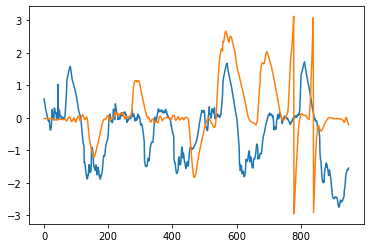

In [60]:
t =8000
plt.plot(yaw_xue[t:t+2000], label='loss')
plt.plot(gt_xue[t:t+2000], label='loss')
plt.show()

In [ ]:
mc_data = []
for i in range(lrf_data_test_raw.shape[0]):
    t_now = lrf_data_test_raw[i][0] + lrf_data_test_raw[i][1]*0.000000001
    for j in range(mc_data_test_raw.shape[0]):
        if t_now < mc_data_test_raw[j][0]:
            if j > 1: 
                if abs(t_now - mc_data_test_raw[j][0]) > abs(t_now - mc_data_test_raw[j-1][0]):
                    mc_data.append(mc_data_test_raw[j-1])
                else:
                    mc_data.append(mc_data_test_raw[j])
                #print(mc_data[-1])
            else:
                mc_data.append(mc_data_test_raw[j])
            break
for i in range(lrf_data_test_raw.shape[0]):
    while mc_data[i][3] > 3.14159265359:
        mc_data[i][3] = mc_data[i][3] - 2*3.14159265359
    while mc_data[i][3] < -3.14159265359:
        mc_data[i][3] = mc_data[i][3] + 2*3.14159265359
mc_data = np.array(mc_data)

print(mc_data.shape,lrf_data_test_raw.shape)